# Level 1 Task 1

In [1]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import folium
from IPython.display import display
from sklearn.cluster import KMeans

In [3]:
df = pd.read_csv("Dataset .csv")
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [4]:
#Drop missing values in "cuisines" column

df_cuisines = df["Cuisines"].dropna()

## Determine The Top Three Most Common Cuisines

In [5]:
#Split and count cuisines

cuisine_count = df['Cuisines'].str.split(',',).explode().value_counts()
top_three_cuisine = cuisine_count.head(3)
print(top_three_cuisine)

Cuisines
North Indian    2992
 Chinese        1880
 Fast Food      1314
Name: count, dtype: int64


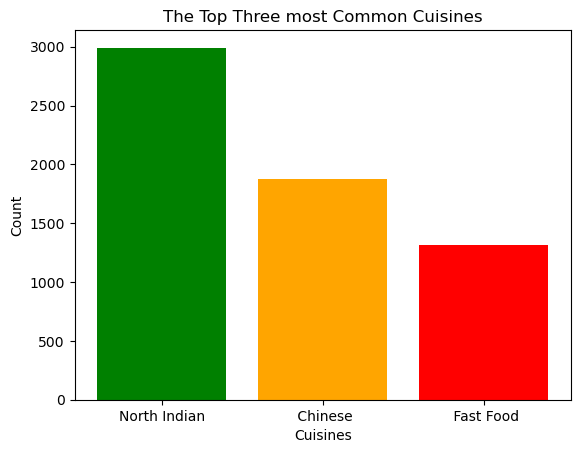

In [6]:
# Create Bar Chart

colors = ['green', 'orange', 'red']
plt.bar(top_three_cuisine.index, top_three_cuisine.values, color=colors)
plt.title("The Top Three most Common Cuisines")
plt.xlabel("Cuisines")
plt.ylabel("Count")
plt.show()

In [7]:
#Calculate the percentage of restaurants serving each top cuisines

total_restaurants = len(df_cuisines)
top_cuisines_percentage = (top_three_cuisine / total_restaurants)* 100

<function matplotlib.pyplot.show(close=None, block=None)>

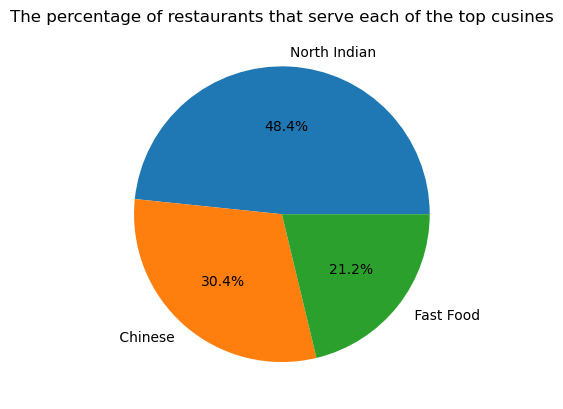

In [8]:
#Create Pie Chart

plt.pie(top_three_cuisine.values, labels = top_three_cuisine.index, autopct = '%1.1f%%')
plt.title("The percentage of restaurants that serve each of the top cusines")
plt.show

# Level 1 TASK 2 

## *Identify the City with the highest number of the restaurants*

In [9]:
#City Counts

city_counts = df['City'].value_counts()
city_with_the_most_restaurants = city_counts.index[0]
print(f"The City with the highest number of restaurants is {city_with_the_most_restaurants} ")

The City with the highest number of restaurants is New Delhi 


## *Calculate the average rating for restaurants in each City*

In [10]:
average_ratings = df.groupby('City')['Aggregate rating'].mean()
print("The Average rating for restaurants in each city")
print(average_ratings)

The Average rating for restaurants in each city
City
Abu Dhabi          4.300000
Agra               3.965000
Ahmedabad          4.161905
Albany             3.555000
Allahabad          3.395000
                     ...   
Weirton            3.900000
Wellington City    4.250000
Winchester Bay     3.200000
Yorkton            3.300000
��stanbul          4.292857
Name: Aggregate rating, Length: 141, dtype: float64


## *City with the highest average rating*

In [11]:
# Find average ratings

city_with_highest_average_rating = average_ratings.idxmax()
print(f"The city with the highest average rating is {city_with_highest_average_rating}")

The city with the highest average rating is Inner City


# Level 1 TASK 3

## *The distribution of price ranges among the restaurants*

In [12]:
price_ranges_per_counts = df['Price range'].value_counts().sort_index()

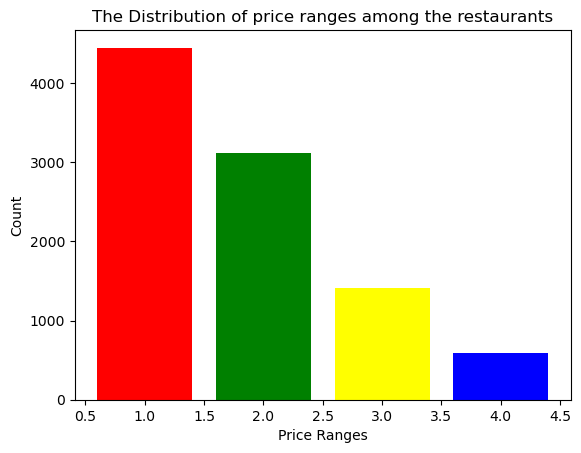

In [13]:
colors = ['red', 'green', 'yellow', 'blue']
plt.bar(price_ranges_per_counts.index, price_ranges_per_counts.values, color=colors)
plt.title("The Distribution of price ranges among the restaurants")
plt.xlabel("Price Ranges")
plt.ylabel("Count")
plt.show()

## *Calculate the percentage of restaurants in each price range category*

In [14]:
df_price_range = df["Price range"].dropna()


In [15]:
#Calculate the number of restaurants

total_restaurants = len(df_price_range)

In [16]:
#Calculate the percentage of restaurants in each price range category 

percentage_per_price_range = (price_ranges_per_counts / total_restaurants)*100
print(percentage_per_price_range)

Price range
1    46.529159
2    32.593446
3    14.741912
4     6.135483
Name: count, dtype: float64


# Level 1 Task 4

## *Determine the percentage of restaurants that offers online delivery*

In [17]:
df_online_delivery = df["Has Online delivery"].dropna()

In [18]:
#Calulate total number of restaurants.

total_restaurants = len(df_online_delivery)

In [19]:
#Determine the percentage of restaurants that offers online delivery.

restaurants_with_online_delivery = df["Has Online delivery"].value_counts().sort_index().get('Yes')
percentage_with_onilne_delivery = (restaurants_with_online_delivery / total_restaurants) * 100
print("The percentage of restaurants that offers online delivery is", percentage_with_onilne_delivery)

The percentage of restaurants that offers online delivery is 25.662234321013504


## *The Average ratings of restaurants with and without Online Delivery*

In [20]:
average_rating_with_online_delivery = df[df["Has Online delivery"] == 'Yes']["Aggregate rating"].mean()
average_rating_without_online_delivery = df[df["Has Online delivery"] == 'No']["Aggregate rating"].mean()

print("Average rating of restaurants with online delivery is", average_rating_with_online_delivery)
print("Avergae rating of restaurants without online delivery", average_rating_without_online_delivery)

Average rating of restaurants with online delivery is 3.2488372093023257
Avergae rating of restaurants without online delivery 2.465295774647887


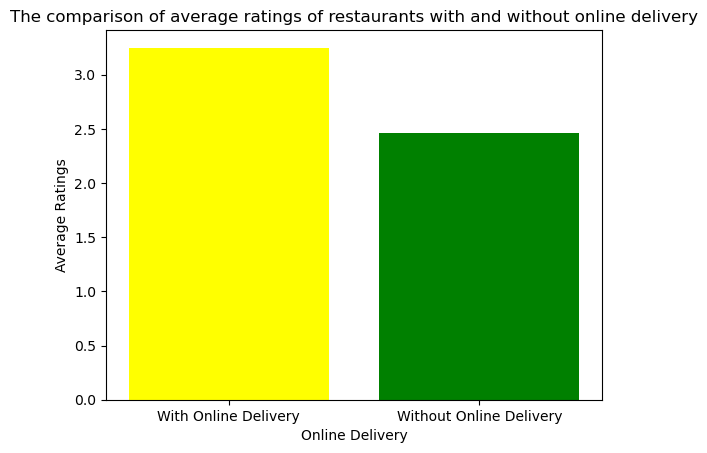

In [21]:
# Create a Bar Chart

labels = ["With Online Delivery", "Without Online Delivery"]
average_ratings = [average_rating_with_online_delivery, average_rating_without_online_delivery]

colors = ["yellow" , "green"]
plt.bar(labels, average_ratings, color = colors)
plt.title("The comparison of average ratings of restaurants with and without online delivery")
plt.xlabel("Online Delivery")
plt.ylabel("Average Ratings")
plt.show()

# Level 2 TASK 1

## *Analyze the distribution of aggregate ratings and determine the most common rating range*

In [22]:
#Find aggregate ratings

aggregate_ratings = df["Aggregate rating"]
rating_counts = aggregate_ratings.value_counts().sort_index()

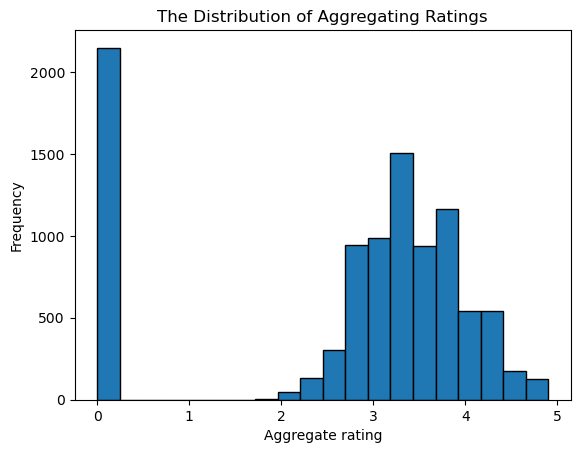

In [23]:
#Create Histogram

plt.hist(aggregate_ratings, bins = 20, edgecolor = 'black')
plt.title("The Distribution of Aggregating Ratings")
plt.xlabel("Aggregate rating")
plt.ylabel("Frequency")
plt.show()

In [24]:
# Find the most commmon rating range

most_common_rating_range = rating_counts.idxmax()
print("The most common rating range is", most_common_rating_range)

The most common rating range is 0.0


## *The Average Number of votes received by restaurants*

In [25]:
average_votes = df['Votes'].mean()
print("The average number of votes received by restaurants is", average_votes)

The average number of votes received by restaurants is 156.909747670401


# Level 2 TASK 2

In [26]:
#Drop missing values in Cuisines column

df = df.dropna(subset = ["Cuisines"])

## *Identify the most common combinations of cuisines in the dataset*

In [27]:
# Identify most common cuisine combinations

common_cuisine_combination = df["Cuisines"].value_counts().head(10)

In [28]:
# Display the Top 10 most common cuisine combinations

print("Top 10 Most Common Cuisine Combination: ")
print(common_cuisine_combination)

Top 10 Most Common Cuisine Combination: 
Cuisines
North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64


## *Determine if certain cuisine combination tend to have higher ratings*

In [29]:
#Analyze Cuisines Combinations and their average ratings

cuisine_ratings = df.groupby("Cuisines")["Aggregate rating"].mean().nlargest(10)

In [30]:
#Display the top 10 highest-rated cuisines combination

print("\nTop 10 Highest-Rated Cuisine Combination: ")
print(cuisine_ratings)


Top 10 Highest-Rated Cuisine Combination: 
Cuisines
American, BBQ, Sandwich         4.9
American, Burger, Grill         4.9
American, Caribbean, Seafood    4.9
American, Coffee and Tea        4.9
American, Sandwich, Tea         4.9
BBQ, Breakfast, Southern        4.9
Burger, Bar Food, Steak         4.9
Continental, Indian             4.9
European, Asian, Indian         4.9
European, Contemporary          4.9
Name: Aggregate rating, dtype: float64


# Level 2 TASK 3

In [31]:
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [32]:
# Drop rows with missing coordinates

df = df.dropna(subset = ["Latitude", "Longitude"])

## *Plot the locations of restaurants on a map using longitude and latitude coordinates*

In [33]:
# Create a Folium map centered at the mean Lattitude and Longitude

map_center = [df["Latitude"].mean(), df["Longitude"].mean()]
restaurant_map = folium.Map(location = map_center, zoom_start = 12)

In [34]:
# Add markers for each restaurant

for index, row in df.iterrows():
    folium.Marker([row["Latitude"], row["Longitude"]],
                 popup = row["Restaurant Name"]).add_to(restaurant_map)

In [35]:
# Save the map on HTML file

restaurant_map.save("restaurant_map.html")

In [36]:
# Display the interaction map

restaurant_map

## *Identify any patterns or clusters of restaurants in specific areas*

In [38]:
# Extract Latitude and Longitude

x = df[['Latitude', 'Longitude']]


In [ ]:
kmeans = KMeans(n_clusters=5, random_state = 42, n_init = 10)
df['Cluster'] = kmeans.fit_predict(x)

In [ ]:
plt.figure(figsize = (10, 6))
plt.scatter(df['Longitude'], df['Latitude'], c = df['Cluster'], cmap = 'viridis', alpha = 0.6)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Restaurant Clusters')
plt.colorbar(label = 'Cluster')
plt.show()

# Level 2 TASK 4

## *Identify if there are any restaurant chains present in the dataset*

In [ ]:
# Identify restaurants chains by counting accurances of restaurant names

restaurant_chains = df['Restaurant Name'].value_counts()

In [ ]:
# Filter Chains with multiple locations

restaurant_chains = restaurant_chains[restaurant_chains > 1]

In [ ]:
#Display the top 10 restaurant chains by number of locations

print("Top 10 Restaurant Chain by number of locations: ")
print(restaurant_chains.head(10))

## *Analyze the ratings and popularity of different restaurant chains*

In [ ]:
# Filter data to include only restaurant chains

chain_data = df[df['Restaurant Name'].isin(restaurant_chains.index)]

In [ ]:
#Compute average ratings and total votes for each chain

chain_ratings = chain_data.groupby("Restaurant Name")["Aggregate rating"].mean()
chain_votes = chain_data.groupby("Restaurant Name")["Votes"].sum()

In [ ]:
#Combine ratings and votes into a single dataframe

chain_analysis = pd.DataFrame({"Average Rating": chain_ratings, "Total Votes": chain_votes})

In [ ]:
# Get the Top 10 highest-rated restaurant chains

top_rated_chains = chain_analysis.nlargest(10, "Average Rating")
print("\nTop 10 Highest-Rated Restaurant Chains: ")
print(top_rated_chains)

In [ ]:
plt.figure(figsize = (12, 6))
plt.barh(top_rated_chains.index[::-1],top_rated_chains["Average Rating"][::-1], color = 'royalblue')
plt.xlabel("Average Rating")
plt.ylabel("Restaurant Chains")
plt.title("Top 10 Highest-Rated Restaurant Chains")
plt.xlim(0, 5) #ratings are between 0 and 5
plt.grid(axis = "x", linestyle="--", alpha = 0.7)

# Display Values and Bars

for index, value in enumerate(top_rated_chains["Average Rating"][::-1]):
    plt.text(value + 0.1, index, f"{value: .1f}", va="center", fontsize=10)

plt.show()

In [ ]:
# Get the top 10 most popular chains based on total votes

top_popular_chains = chain_analysis.nlargest(10, "Total Votes")
print("\nTop 10 Most Popular Restaurant Chains by Total Votes: ")
print(top_popular_chains)

In [ ]:
# Plot most popular restaurant chains based on total votes

plt.figure(figsize = (12, 6))
plt.barh(top_popular_chains.index[::-1], top_popular_chains["Total Votes"][::-1], color = "darkorange")
plt.xlabel("Total Votes")
plt.ylabel("Restaurant Chains")
plt.title("Top 10 Most Popular Restaurant Chains (by Votes)")
plt.grid(axis= 'x', linestyle="--", alpha=0.7)

# Display values on bars

for index, value in enumerate(top_popular_chains["Total Votes"][::-1]):
    plt.text(value + 50, index, f"{value:,}", va="center", fontsize = 10)

plt.show()

# Level 3 TASK 1

In [ ]:
#Display basic information about the dataset

df.info(), df.head()

## *Analyze the text reveiews to identify the most common positive and negative keywors*

In [ ]:
#Count occurences of rating text categories

rating_counts = df["Rating text"].value_counts()

In [ ]:
# Visualize the distribution of rating text categories

plt.figure(figsize=(10,5))
sns.barplot(x = rating_counts.index, y = rating_counts.values)
plt.xticks(rotation=45)
plt.xlabel("Rating Category")
plt.ylabel("Count")
plt.title("Distribution of Rating Text Categories")
plt.show()

In [ ]:
# Display the most common rating text categories

rating_counts

In [ ]:
from collections import Counter

In [ ]:
# Define Positive and Negative Ratings

positive_ratings = ["Excellent", "Very_good", "Good"]
negative_ratings = ["Average", "Poor"]

In [ ]:
# Count Occurences of positive and negative words

positive_words = " ".join(df[df["Rating text"].isin(positive_ratings)]["Rating text"]).lower().split()
negative_words = " ".join(df[df["Rating text"].isin(negative_ratings)]["Rating text"]).lower().split()

In [ ]:
# Get the most common words 

positive_word_counts = Counter(positive_words).most_common(5)
negative_word_counts = Counter(negative_words).most_common(5)

positive_word_counts, negative_word_counts

## *Calculate the average length of reviews and explore if there is a relationship between review length and Rating*

In [40]:
#Calculate the lenght of ratong text 

df["Rating text length"] = df["Rating text"].apply(lambda x: len(x.split()))

In [41]:
#Compute the average length of rating text

average_length =df["Rating text length"].mean()

In [45]:
order = df["Rating text"].value_counts().index

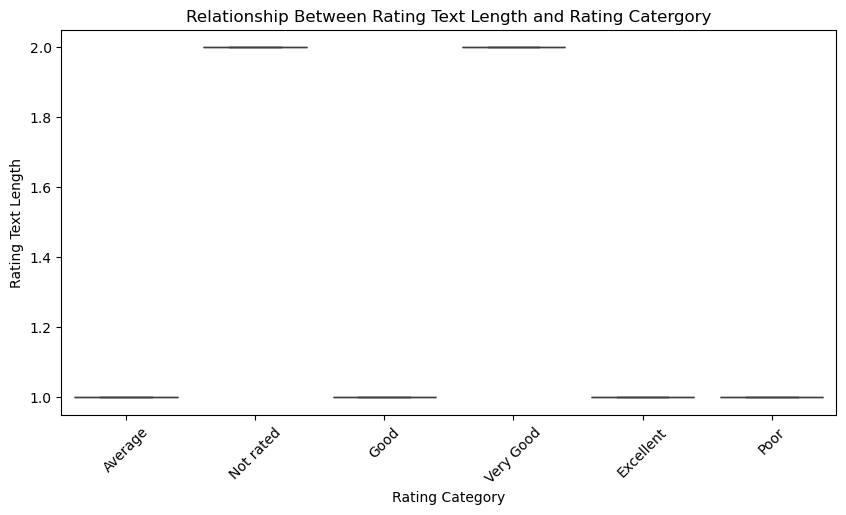

np.float64(1.3380842590651856)

In [46]:
# Visualize the relationship between rating text length and aggregate rating

plt.figure(figsize=(10, 5))
sns.boxplot(x="Rating text", y="Rating text length", data = df, order = order)
plt.xticks(rotation=45)
plt.xlabel("Rating Category")
plt.ylabel("Rating Text Length")
plt.title("Relationship Between Rating Text Length and Rating Catergory")
plt.show()

average_length

# Level 3 TASK 2

## *Identify the restaurants with the Highest and Lowest Number of Votes*

In [49]:
# Identify the restaurants with the highest and lowest number of votes

highest_votes = df.loc[df["Votes"].idxmax()]
lowest_votes = df.loc[df["Votes"].idxmin()]

In [50]:
# Display thier details

highest_votes[["Restaurant Name", "Votes", "Aggregate rating"]], lowest_votes[["Restaurant Name", "Votes", "Aggregate rating"]]

(Restaurant Name      Toit
 Votes               10934
 Aggregate rating      4.8
 Name: 728, dtype: object,
 Restaurant Name     Cantinho da Gula
 Votes                              0
 Aggregate rating                 0.0
 Name: 69, dtype: object)

## *Analyze if there is a coorelation between the number of votes and the rating of a restaurant*

In [54]:
# Check Coorelation between votes and Aggregate rating 

correlation  = df["Votes"].corr(df["Aggregate rating"])

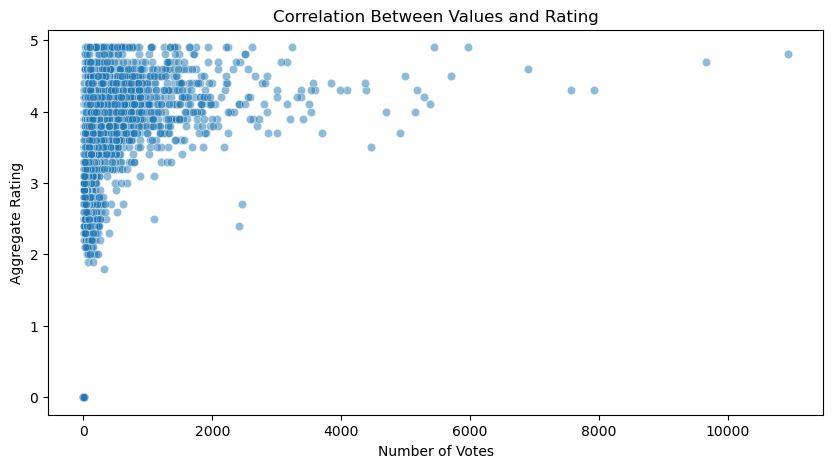

In [52]:
# Visualize the relationship using a scatter plot

plt.figure(figsize = (10, 5))
sns.scatterplot(x = df["Votes"], y=df["Aggregate rating"], alpha = 0.5)
plt.xlabel("Number of Votes")
plt.ylabel("Aggregate Rating")
plt.title("Correlation Between Values and Rating")
plt.show()

In [55]:
# Display the correlation cofficient

correlation

np.float64(0.3134741803250024)

# Level 3 TASK 3

## *Analyze if there is a Relationship Between the Price Range and the Availability of Online Delivery and Table Booking*

In [88]:
# Group by price range and calculate the mean availability of services

df["Has Table booking"] = df["Has Table booking"].map({"Yes": 1, "No": 0})
df["Has Online delivery"] = df["Has Online delivery"].map({"Yes": 1, "No": 0})


In [89]:
price_range_analysis = (df.groupby("Price range")[["Has Table booking", "Has Online delivery"]].mean())
print(str(price_range_analysis))

             Has Table booking  Has Online delivery
Price range                                        
1                          NaN                  NaN
2                          NaN                  NaN
3                          NaN                  NaN
4                          NaN                  NaN


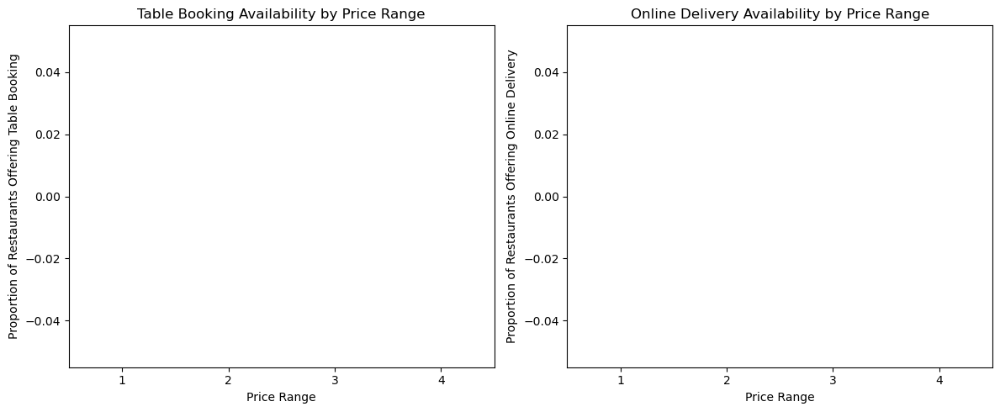

In [90]:
# Plot the relationship

fig, ax = plt.subplots(1,2, figsize=(12, 5))
sns.barplot(x = price_range_analysis.index, y = price_range_analysis["Has Table booking"], ax=ax[0])
ax[0].set_title("Table Booking Availability by Price Range")
ax[0].set_xlabel("Price Range")
ax[0].set_ylabel("Proportion of Restaurants Offering Table Booking")

sns.barplot(x=price_range_analysis.index, y=price_range_analysis["Has Online delivery"], ax=ax[1])
ax[1].set_title("Online Delivery Availability by Price Range")
ax[1].set_xlabel("Price Range")
ax[1].set_ylabel("Proportion of Restaurants Offering Online Delivery")

plt.tight_layout()
plt.show()

## *Determine if Higher-Priced Restaurants are more likely to Offer these services*

In [91]:
# Correlation analysis to check the strength of the relationship

correlation = df[["Price range", "Has Table booking", "Has Online delivery"]].corr()
print(correlation)

                     Price range  Has Table booking  Has Online delivery
Price range                  1.0                NaN                  NaN
Has Table booking            NaN                NaN                  NaN
Has Online delivery          NaN                NaN                  NaN


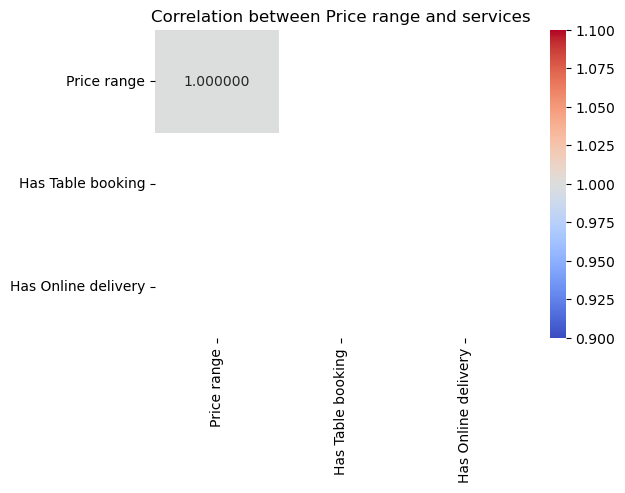

In [92]:
plt.figure(figsize=(6,4))
sns.heatmap(correlation, annot=True, cmap="coolwarm", fmt="2f")
plt.title("Correlation between Price range and services")
plt.show()